## Challenge

### Understanding news articles

In [135]:
# All import packages
import pandas as pd

import altair as alt
#alt.renderers.enable("notebook")

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")

# Code for hiding seaborn warnings
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.svm import LinearSVC
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

In [63]:
# Read the dataset provided for the task

dataset = pd.read_csv("C:/Users/priya/Downloads/news/news.csv")
dataset.head(5)

,Unnamed: 0,date,category,text
0,0,2016-01-04 05:30:00.000000,Wirtschaft,Der Kampf gegen die Steuerflucht steht 2016 im...
1,1,2015-07-02 07:08:55.000000,Wirtschaft,Der Volltext dieses auf Agenturmeldungen basie...
2,2,2016-05-07 11:00:00.000000,Web,"Das Experiment beginnt Freitagabend, am Wochen..."
3,3,2016-05-23 09:41:27.000000,Web,"""Was waren die schlimmsten Erlebnisse, die ihr..."
4,4,2015-06-05 12:55:37.000000,Wirtschaft,Wien – Seitdem die Internationale Agentur für ...


## EDA

Lets plot the number of category data

In [65]:
alt.data_transformers.disable_max_rows()

bars = alt.Chart(dataset).mark_bar(size=50).encode(
    x=alt.X("category"),
    y=alt.Y("count():Q", axis=alt.Axis(title='Number of articles')),
    tooltip=[alt.Tooltip('count()', title='Number of articles'), 'category'],
    color='category'

)

text = bars.mark_text(
    align='center',
    baseline='bottom',
).encode(
    text='count()'
)

(bars + text).interactive().properties(
    height=300, 
    width=700,
    title = "Number of articles in each category",
)

alt.LayerChart(...)

Percentage of each category

In [67]:
dataset['id'] = 1
dateset2 = pd.DataFrame(dataset.groupby('category').count()['id']).reset_index()

bars = alt.Chart(dateset2).mark_bar(size=50).encode(
    x=alt.X('category'),
    y=alt.Y('PercentOfTotal:Q', axis=alt.Axis(format='.0%', title='% of Articles')),
    color='category'
).transform_window(
    TotalArticles='sum(id)',
    frame=[None, None]
).transform_calculate(
    PercentOfTotal="datum.id / datum.TotalArticles"
)

text = bars.mark_text(
    align='center',
    baseline='bottom',
    #dx=5  # Nudges text to right so it doesn't appear on top of the bar
).encode(
    text=alt.Text('PercentOfTotal:Q', format='.1%')
)

(bars + text).interactive().properties(
    height=300, 
    width=700,
    title = "% of articles in each category",
)

alt.LayerChart(...)

Finding length of each text in category

In [68]:
dataset['text_length'] = dataset['text'].str.len()

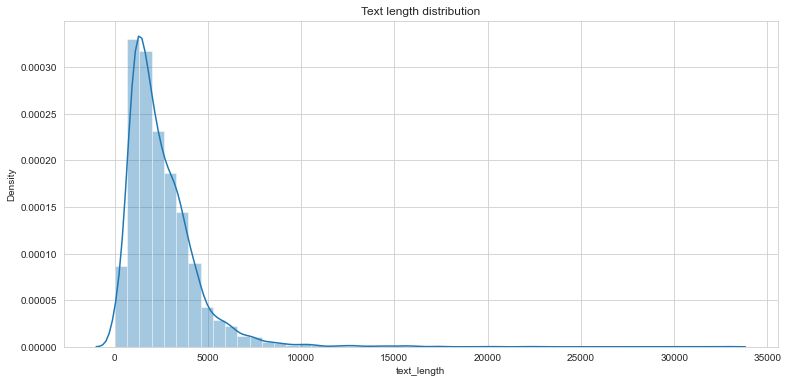

In [76]:
plt.figure(figsize=(12.8,6))
sns.distplot(dataset['text_length']).set_title('Text length distribution');

In [77]:
dataset['text_length'].describe()

count     5481.000000
mean      2511.837621
std       1884.947272
min         25.000000
25%       1266.000000
50%       2069.000000
75%       3285.000000
max      32809.000000
Name: text_length, dtype: float64

To better view of the histogram, removing 95% percentile

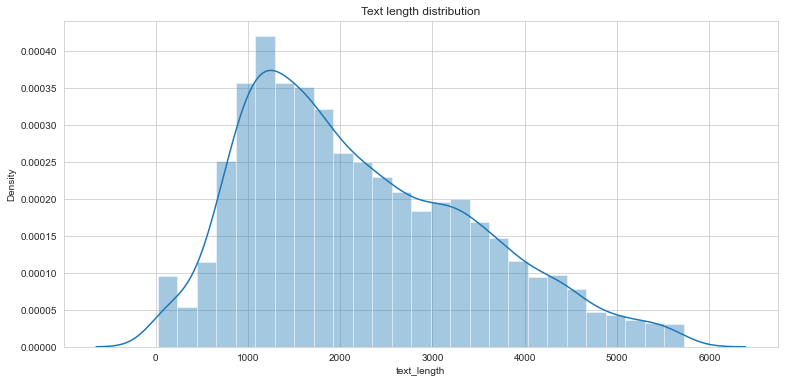

In [80]:
q_95 = dataset['text_length'].quantile(0.95)
dataset_95 = dataset[dataset['text_length'] < q_95]

plt.figure(figsize=(12.8,6))
sns.distplot(dataset_95['text_length']).set_title('Text length distribution');

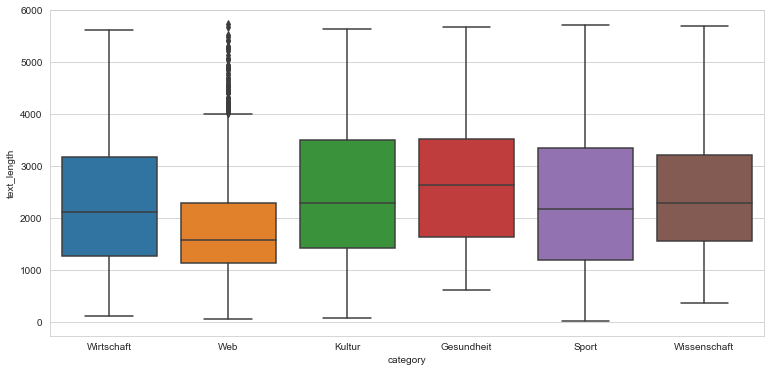

In [81]:
plt.figure(figsize=(12.8,6))
sns.boxplot(data=dataset_95, x='category', y='text_length');

But we have text which are long upto 30000.

Also, we can clearly see the length distribution is different for each categories, this we can stop the EDA process here

### Data Cleaning

In [38]:
dataset.columns

Index(['Unnamed: 0', 'date', 'category', 'text'], dtype='object')

We wont require the column named "Unnamed: 0" as they are equal to the index value.

In [39]:
dataset.drop('Unnamed: 0', axis = 1, inplace = True)

In [40]:
dataset.head(5)

,date,category,text
0,2016-01-04 05:30:00.000000,Wirtschaft,Der Kampf gegen die Steuerflucht steht 2016 im...
1,2015-07-02 07:08:55.000000,Wirtschaft,Der Volltext dieses auf Agenturmeldungen basie...
2,2016-05-07 11:00:00.000000,Web,"Das Experiment beginnt Freitagabend, am Wochen..."
3,2016-05-23 09:41:27.000000,Web,"""Was waren die schlimmsten Erlebnisse, die ihr..."
4,2015-06-05 12:55:37.000000,Wirtschaft,Wien – Seitdem die Internationale Agentur für ...


Lets check whether there are duplicate values

In [41]:
dataset[dataset.duplicated()]

,date,category,text


**no duplicates found** 

In [42]:
dataset.isnull().sum().values

array([0, 0, 6], dtype=int64)

In [43]:
# As there is null values in text column, 
# lets find the rows without null value
dataset = dataset[dataset["text"].notnull()]

6 rows are deleted from the dataset due to NULL values

In [44]:
dataset.shape

(5481, 3)

Lets find the number of categories available

In [45]:
print(f"Total unique categories are: {len(dataset['category'].value_counts())}")
print(f"Count of occurance of each category:")
dataset['category'].value_counts()

Total unique categories are: 6
Count of occurance of each category:


Web             1614
Wirtschaft      1335
Sport           1190
Wissenschaft     566
Kultur           510
Gesundheit       266
Name: category, dtype: int64

Lets check the spaces in the text

In [46]:
spaces = []
for i, j in enumerate(dataset['text']):
    if type(j) == str:
        if j.isspace():
            spaces.append(i)
        
print(len(spaces), 'spaces in index: ', spaces)

0 spaces in index:  []


The final train dataset consist of category and text columns

In [47]:
x = dataset["text"]
y = dataset["category"]

x.head()

0    Der Kampf gegen die Steuerflucht steht 2016 im...
1    Der Volltext dieses auf Agenturmeldungen basie...
2    Das Experiment beginnt Freitagabend, am Wochen...
3    "Was waren die schlimmsten Erlebnisse, die ihr...
4    Wien – Seitdem die Internationale Agentur für ...
Name: text, dtype: object

**Preparing the data for training a classifier model**

In [48]:
# Split the data into 70-30 i.e. test size of 30% to check the 
# accuracy of the training
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3)

In [49]:
# Lets find the number of rows after the split
print(f"Training Data Shape: {x_train.shape}")
print(f"Testing Data Shape: {x_test.shape}")

Training Data Shape: (3836,)
Testing Data Shape: (1645,)


### Lets vectorize the text data for feature extraction 

Trying Count Vectorizer for this purpose

In [53]:
vect = CountVectorizer()

In [54]:
x_train_vect = vect.fit_transform(x_train)
x_train_vect.shape

(3836, 108737)

It shows that we have 3836 texts of categories with 108738 relevant words.

In [56]:
x_train_vect

<3836x108737 sparse matrix of type '<class 'numpy.int64'>'
	with 845336 stored elements in Compressed Sparse Row format>

### Lets do model training

In [84]:
clf = LinearSVC()
clf.fit(x_train_vect,y_train)

LinearSVC()

In [85]:
x_test1 = x_test[0:2]
print(x_test1)

5231    Wolfsburg – Inmitten der Abgasaffäre hat Volks...
4831    Paris – Nach den Terroranschlägen in Paris ist...
Name: text, dtype: object


These are of category Wirtschaft and Sport

In [92]:
x_test1_vect = vect.transform(x_test1)
clf.predict(x_test1_vect)

array(['Wirtschaft', 'Sport'], dtype=object)

### Both are predicted correctly

Lets test the entire dataset now

In [94]:
# Transform the test data
x_test_vect = vect.transform(x_test)

# Prediction set
predictions = clf.predict(x_test_vect)

In [99]:
# Confusion matrix
print(metrics.confusion_matrix(y_test,predictions))
# Classification report
print(metrics.classification_report(y_test,predictions))
# Overall accuracy
print("Accuracy = ",metrics.accuracy_score(y_test,predictions))

[[ 77   1   1   2  10   6]
 [  1 127   3   8   9   4]
 [  0   1 343   5   7   0]
 [  2   4   0 427  48   4]
 [  3   6   1  17 352   1]
 [  7   3   1   7  20 137]]
              precision    recall  f1-score   support

  Gesundheit       0.86      0.79      0.82        97
      Kultur       0.89      0.84      0.86       152
       Sport       0.98      0.96      0.97       356
         Web       0.92      0.88      0.90       485
  Wirtschaft       0.79      0.93      0.85       380
Wissenschaft       0.90      0.78      0.84       175

    accuracy                           0.89      1645
   macro avg       0.89      0.86      0.87      1645
weighted avg       0.89      0.89      0.89      1645

Accuracy =  0.8893617021276595


The Accuracy of the model is good!

Lets try other models

with TF-IDF

In [140]:
clf_tfidf = Pipeline([('tfidf', TfidfVectorizer()),
                     ('clf', LinearSVC())])

# Feed the training data through the pipeline
clf_tfidf.fit(x_train, y_train)

# Form a prediction set
predictions = clf_tfidf.predict(x_test)
# Print the overall accuracy
print(metrics.accuracy_score(y_test,predictions))

0.9221884498480243


Naive Bayes

In [141]:
clf_tfidf_mnb = Pipeline([('tfidf', TfidfVectorizer()),
                     ('clf', MultinomialNB())])

# Feed the training data through the pipeline
clf_tfidf_mnb.fit(x_train, y_train)  

# Form a prediction set
predictions = clf_tfidf_mnb.predict(x_test)
# Print the overall accuracy
print(metrics.accuracy_score(y_test,predictions))

0.6948328267477204


Logistic Regression

In [143]:
clf_tfidf_lr = Pipeline([('tfidf', TfidfVectorizer()),
                     ('clf', LogisticRegression())])

# Feed the training data through the pipeline
clf_tfidf_lr.fit(x_train, y_train)

predictions = clf_tfidf_lr.predict(x_test)
# Print the overall accuracy
print(metrics.accuracy_score(y_test,predictions))

0.8595744680851064


K-NN classifier

In [145]:
clf_tfidf_knc = Pipeline([('tfidf', TfidfVectorizer()),
                     ('clf', KNeighborsClassifier())])

# Feed the training data through the pipeline
clf_tfidf_knc.fit(x_train, y_train)

predictions = clf_tfidf_knc.predict(x_test)
# Print the overall accuracy
print(metrics.accuracy_score(y_test,predictions))

0.7993920972644377


Random Forest

In [146]:
clf_tfidf_rfc = Pipeline([('tfidf', TfidfVectorizer()),
                     ('clf', RandomForestClassifier())])

# Feed the training data through the pipeline
clf_tfidf_rfc.fit(x_train, y_train)

predictions = clf_tfidf_rfc.predict(x_test)
# Print the overall accuracy
print(metrics.accuracy_score(y_test,predictions))

0.79209726443769


**Performance of classifiers<br>
LinearSVC = 0.88<br>
Naive Bayes = 0.69<br>
Logistic Regression = 0.85<br>
KNN = 0.79<br>
Random Forest = 0.79**

Will look for the separability of the classes in LinearSVC

In [168]:
def show_linearSVC_class_separation(linearSVC: 'LinearSVC', X_test, y_test):

    y_decision_score = linearSVC.decision_function(X_test)

    # getting the score of the truly positive individuals
    y_positive_decision_score = y_decision_score[y_test == 1]

    # getting the score of the truly negative individuals
    y_negative_decision_score = y_decision_score[y_test == 0]

    # get the (min-1) and the (max +1) scores to be sure to include all the scores in the intervals of the histogramme
    _, min_positive = np.modf(y_positive_decision_score.min() - 1)
    _, max_positive = np.modf(y_positive_decision_score.max() + 1)
    positive_bins = np.arange(min_positive, max_positive + 1)

    # get the (min-1) and the (max +1) scores to be sure to include all the scores in the intervals of the histogramme    
    _, min_negative = np.modf(y_negative_decision_score.min() - 1)
    _, max_negative = np.modf(y_negative_decision_score.max() + 1)
    negative_bins = np.arange(min_negative, max_negative + 1)

    # plot the two histograms, alpha (the transparency) is for the overlapping areas
    plt.hist(y_positive_decision_score, bins=positive_bins, alpha=0.5, label='True positives', color='b')
    plt.hist(y_negative_decision_score, bins=negative_bins, alpha=0.5, label='True negatives', color='r')

    plt.xlabel('SVM decision_function values')
    plt.ylabel('Number of data points')
    plt.show()

In [ ]:
show_linearSVC_class_separation(clf,x_test,y_test)